# EXAM May 24 - June 7, 2024 - part 2

## Imports / basic setup

In [1]:
import logging
import threading
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_predict, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, confusion_matrix, f1_score, make_scorer
import math
from sklearn.feature_selection import VarianceThreshold
import concurrent.futures
from sklearn.metrics import roc_auc_score
from joblib import dump, load
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

In [2]:
%matplotlib inline
random_state = 42
np.random.seed(random_state)
print_lock = threading.Lock()
sns.set_style("darkgrid")

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(message)s')

## Reading data

In [3]:
df = pd.read_csv('../data/MyMNIST.csv')

X_mnist = df.drop('label', axis=1)
y_mnist = df['label']

In [4]:
print(X_mnist.shape, y_mnist.shape)

(50000, 784) (50000,)


In [5]:
print(y_mnist.value_counts())

label
1    5621
7    5211
3    5129
2    4971
9    4931
6    4920
0    4915
8    4910
4    4847
5    4545
Name: count, dtype: int64


## Constants / Functions

In [6]:
scaler = StandardScaler()

#### Model hyper-parameters

### Utilities functions

In [7]:
def splits(X, y, test_size=0.2, validation_set=False, validation_size=0.2):
    """
    Split the input data into training, validation, and test sets.

    Parameters:
    - X (array-like): The input features.
    - Y (array-like): The target variable.
    - test_size (float, optional): The proportion of the data to include in the test set. Default is 0.2.
    - validation_set (bool, optional): Whether to include a validation set. Default is False.
    - validation_size (float, optional): The proportion of the data to include in the validation set. Default is 0.2.

    Returns:
    - If validation_set is False:
        - X_train (array-like): The training features.
        - X_test (array-like): The test features.
        - Y_train (array-like): The training target variable.
        - Y_test (array-like): The test target variable.
    - If validation_set is True:
        - X_train (array-like): The training features.
        - X_val (array-like): The validation features.
        - X_test (array-like): The test features.
        - Y_train (array-like): The training target variable.
        - Y_val (array-like): The validation target variable.
        - Y_test (array-like): The test target variable.
    """
    X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    
    if validation_set:
        X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=validation_size, random_state=random_state, stratify=Y_train)
        return X_train, X_val, X_test, Y_train, Y_val, Y_test
    
    
    return X_train, X_test, Y_train, Y_test

def display_mnist_images(data, num_images=4):
    plt.figure(figsize=(8, 8))

    ss = np.random.choice(range(0, len(data)), num_images, replace=False)

    for i, kk in enumerate(ss, start=1):
        a = np.array(data.iloc[kk, 0:]).reshape(28, 28)
        plt.subplot(int(np.ceil(num_images/2)), 2, i)
        plt.imshow(a, cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

### Main / wrapper functions

## Exploratory Data Analysis (EDA)

In [8]:
X_train, X_test, y_train, y_test = splits(X_mnist, y_mnist, test_size=0.2)

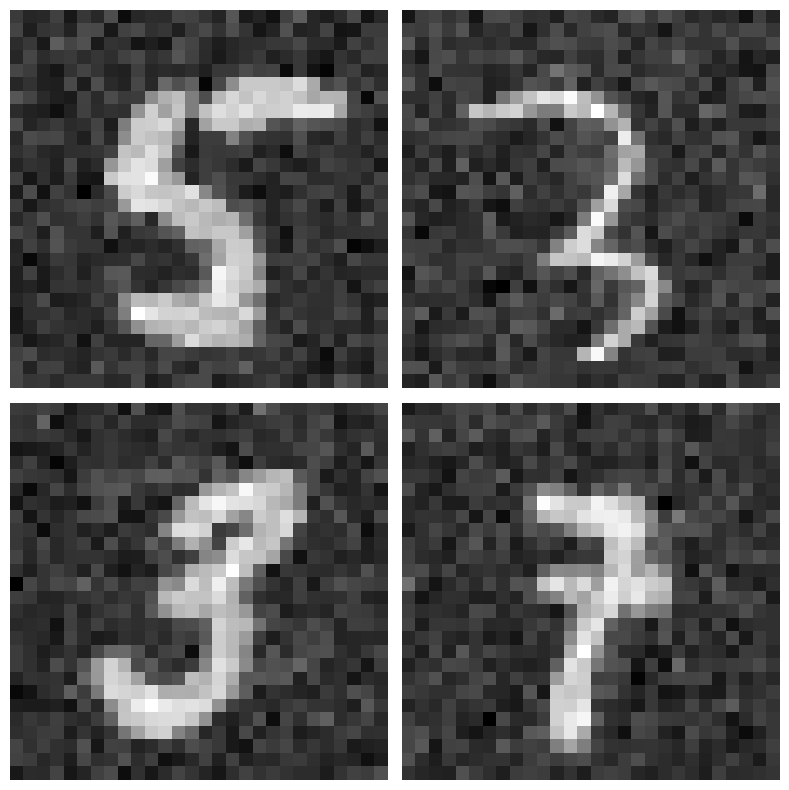

In [9]:
display_mnist_images(X_train, num_images=4)

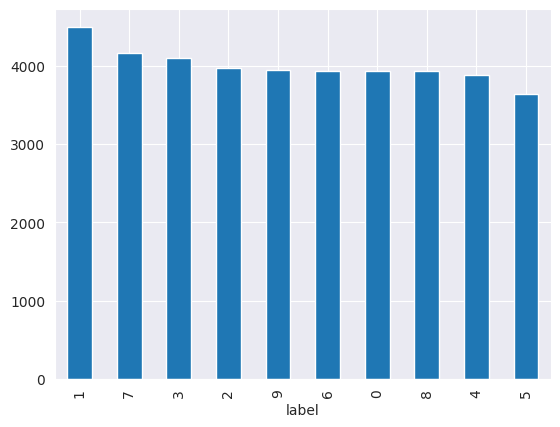

In [10]:
# check for class imbalance with the training set
y_train.value_counts().plot(kind='bar')

plt.show()

## 2a: Exploring the Dataset Structure through Dimensionality Reduction and Filtering

In [11]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.random_projection import GaussianRandomProjection
from sklearn.manifold import TSNE
import umap
import plotly.express as px
import plotly.graph_objects as go

# Apply dimensionality reduction techniques
n_components = 3

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

/home/lucamodica/mambaforge/envs/statistical/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Plot funcs

In [12]:
def plot_dim_reduction_2d_3d(X_reduced, labels, title):
    """
    Plot the reduced-dimensional data in 2D and 3D, in separate subplots.
    """
    df_2d = pd.DataFrame({"Dimension 1": X_reduced[:, 0], "Dimension 2": X_reduced[:, 1], "Digit": labels})
    df_3d = pd.DataFrame({"Dimension 1": X_reduced[:, 0], "Dimension 2": X_reduced[:, 1], "Dimension 3": X_reduced[:, 2], "Digit": labels})
    
    # Create a 2D scatter plot using seaborn
    fig = plt.figure(figsize=(18, 8))
    
    # 2D scatter plot
    ax1 = fig.add_subplot(121)
    for digit in sorted(df_2d["Digit"].unique()):
        subset = df_2d[df_2d["Digit"] == digit]
        ax1.scatter(subset["Dimension 1"], subset["Dimension 2"], label=str(digit), marker=f'${digit}$', s=40, lw=0)
    
    ax1.set_title("2D Scatter Plot")
    ax1.set_xlabel("")
    ax1.set_ylabel("")
    
    # 3D scatter plot
    ax2 = fig.add_subplot(122, projection='3d')
    for digit in sorted(df_3d["Digit"].unique()):
        subset = df_3d[df_3d["Digit"] == digit]
        ax2.scatter(
            subset["Dimension 1"], 
            subset["Dimension 2"], 
            subset["Dimension 3"], 
            label=str(digit), 
            marker=f'${digit}$',
            s=40,
            lw=0
        )
        
    ax2.set_title("3D Scatter Plot")
    ax2.set_xlabel("Dimension 1")
    ax2.set_ylabel("Dimension 2")
    ax2.set_zlabel("Dimension 3")
    ax2.legend(title="Digit", loc="best")
    ax2.view_init(elev=20, azim=45)
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


def plot_dim_reduction_3d_plotly(X_reduced, labels, title):
    """
    Plot the reduced-dimensional data in 2D and 3D, in separate subplots.
    """
    df_3d = pd.DataFrame({"Dimension 1": X_reduced[:, 0], "Dimension 2": X_reduced[:, 1], "Dimension 3": X_reduced[:, 2], "Digit": labels})
    
    # 3D scatter plot
    fig2 = go.Figure()
    for digit in sorted(df_3d["Digit"].unique()):
        subset = df_3d[df_3d["Digit"] == digit]
        fig2.add_trace(
            go.Scatter3d(x=subset["Dimension 1"], y=subset["Dimension 2"], z=subset["Dimension 3"], mode="markers", marker=dict(size=3), name=str(digit))
        )
        
    fig2.update_layout(
        title="3D Scatter Plot",
        scene=dict(
            xaxis_title="Dimension 1",
            yaxis_title="Dimension 2",
            zaxis_title="Dimension 3"
        )
    )
    # remove margins
    fig2.update_layout(margin=dict(l=0, r=0, t=0, b=0))
    
    # Display both plots
    fig2.show()

Dimensional reduction technique to use:
- Incremental PCA (IPCA) (batches = 5000)
- UMAP
- Linear Discriminant Analysis (LDA)

### Incremental PCA

In [13]:
# IPCA
from sklearn.decomposition import IncrementalPCA

def run_ipca(n_components=4, batch_size=5000):
    # Initialize IPCA with the desired number of components and batch size
    ipca = IncrementalPCA(n_components=n_components, batch_size=batch_size)

    # Fit IPCA to the data incrementally
    for i in range(0, len(X_train), batch_size):
        # scale the batch
        batch = pd.DataFrame(X_train[i:i+batch_size])
        batch = scaler.fit_transform(batch)
        ipca.partial_fit(batch)

    # Transform the data using the fitted IPCA
    X_ipca = ipca.transform(X_train)
    print(X_ipca.shape)
    X_ipca_df = pd.DataFrame({'PC1': X_ipca[:, 0], 'PC2': X_ipca[:, 1], 'PC3': X_ipca[:, 2], 'PC4': X_ipca[:, 3], 'Digit': y_train})
    
    return X_ipca_df, X_ipca, ipca

In [14]:
X_ipca_df, X_ipca, ipca = run_ipca(n_components=4)

(40000, 4)


/home/lucamodica/mambaforge/envs/statistical/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but IncrementalPCA was fitted without feature names
  warnings.warn(


In [19]:
# plot the reduced data in a 2x2 subplot with
# the first two components in the first plot
# the first and third components in the second plot
# the first and fourth components in the third plot
# the second and third components in the fourth plot
def plot_pcs(X_pca_df):
  fig, ax = plt.subplots(2, 2, figsize=(17, 15))
  
  def plot_scatter_numbers(X_pca_df, ax, x, y):
    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
    for i in X_pca_df['Digit'].unique():
      subset = X_pca_df[X_pca_df['Digit'] == i]
      ax.scatter(subset[x], subset[y], label=i, color=colors[i], s=45, lw=0, alpha=0.8, marker=f'${i}$')
      
    ax.legend(title='Digit')
    ax.set_xlabel(x)
    ax.set_ylabel(y)
    
    
  plot_scatter_numbers(X_pca_df, ax[0, 0], 'PC1', 'PC2')
  plot_scatter_numbers(X_pca_df, ax[0, 1], 'PC1', 'PC3')
  plot_scatter_numbers(X_pca_df, ax[1, 0], 'PC1', 'PC4')
  plot_scatter_numbers(X_pca_df, ax[1, 1], 'PC2', 'PC3')


  fig.suptitle('IPCA: First 4 Principal Components')
  plt.tight_layout()
  plt.show()
  
plot_pcs(X_ipca_df)

NameError: name 'X_ipca_df' is not defined

In [16]:
# dataframe with the variance explained by multiple of 100 components
# variance_df = pd.DataFrame({
#     'Number of Components': np.arange(1, 785, 100),
#     'Explained Variance': np.cumsum(ipca.explained_variance_ratio_)[::100]
# })
# display(variance_df)

# # export in latex format
# print(variance_df.to_latex(index=False, float_format="%.2f", caption="Explained Variance Ratio by Number of Components (IPCA)", label="tab:explained_variance_ratio_ipca", bold_rows=True, column_format="|c|c|"))

In [17]:
X_ipca_df, X_ipca, ipca = run_ipca(n_components=3)
plot_dim_reduction_3d_plotly(X_ipca, y_train, "IPCA: First 3 Principal Components")

/home/lucamodica/mambaforge/envs/statistical/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but IncrementalPCA was fitted without feature names
  warnings.warn(


(40000, 3)


IndexError: index 3 is out of bounds for axis 1 with size 3

In [ ]:
from sklearn.metrics import mean_squared_error

X_ipca_reconstructed = ipca.inverse_transform(X_ipca)
mse_ipca = mean_squared_error(X_train_scaled, X_ipca_reconstructed)
print("Incremental PCA - Reconstruction Error (MSE):", mse_ipca)

Incremental PCA - Reconstruction Error (MSE): 1.0674424736975308


In [ ]:
# for multiple components in multiples of 100, compute the reconstruction error and the explained variance ratio
reconstruction_errors = []
explained_variance_ratios = []

for i in range(1, 785, 100):
    ipca = IncrementalPCA(n_components=i, batch_size=5000)
    for j in range(0, len(X_train_scaled), 5000):
        batch = X_train_scaled[j:j+5000]
        ipca.partial_fit(batch)
    X_ipca = ipca.transform(X_train_scaled)
    X_ipca_reconstructed = ipca.inverse_transform(X_ipca)
    mse = mean_squared_error(X_train_scaled, X_ipca_reconstructed)
    reconstruction_errors.append(mse)
    explained_variance_ratios.append(np.sum(ipca.explained_variance_ratio_))
    
# create a dataframe with the reconstruction errors and explained variance ratios
reconstruction_df = pd.DataFrame({
    'Number of Components': np.arange(1, 785, 100),
    'Mean Reconstruction Error': reconstruction_errors,
    'Explained Variance Ratio': explained_variance_ratios
})
display(reconstruction_df)

,Number of Components,Mean Reconstruction Error,Explained Variance Ratio
0,1,0.955238,0.044758
1,101,0.525042,0.473128
2,201,0.391443,0.605719
3,301,0.266838,0.730039
4,401,0.153301,0.844166
5,501,0.073372,0.925783
6,601,0.032767,0.966881
7,701,0.011515,0.988306


In [ ]:
print(reconstruction_df.to_latex(index=False, float_format="%.2f", caption="Reconstruction Error and Explained Variance Ratio by Number of Components (IPCA)", label="tab:reconstruction_error_ipca", bold_rows=True, column_format="|c|c|c|"))

\begin{table}
\caption{Reconstruction Error and Explained Variance Ratio by Number of Components (IPCA)}
\label{tab:reconstruction_error_ipca}
\begin{tabular}{|c|c|c|}
\toprule
Number of Components & Mean Reconstruction Error & Explained Variance Ratio \\
\midrule
1 & 0.96 & 0.04 \\
101 & 0.53 & 0.47 \\
201 & 0.39 & 0.61 \\
301 & 0.27 & 0.73 \\
401 & 0.15 & 0.84 \\
501 & 0.07 & 0.93 \\
601 & 0.03 & 0.97 \\
701 & 0.01 & 0.99 \\
\bottomrule
\end{tabular}
\end{table}



Reconstruction quite high

### LDA

pros:
- LDA is a supervised dimensionality reduction technique
- LDA is a linear transformation technique
- LDA is a classification technique

cons:
- the number of components is limited to the number of classes minus one

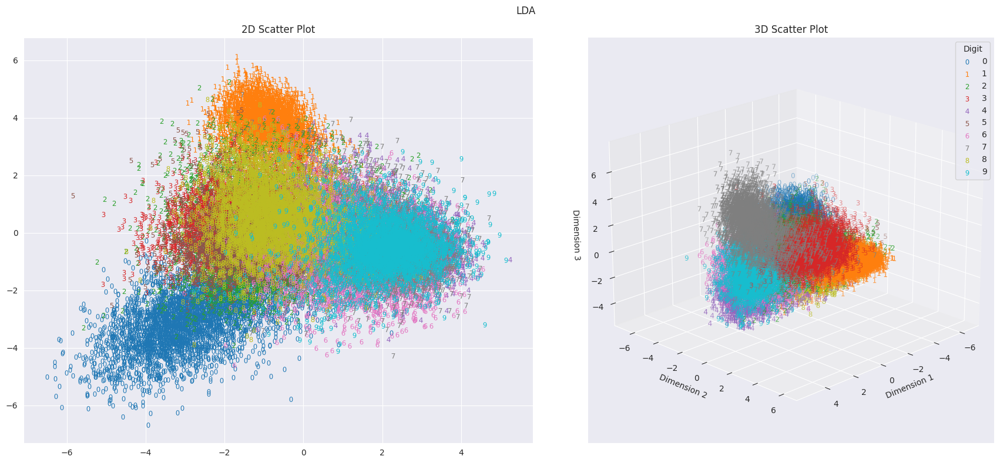

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# LDA
lda = LinearDiscriminantAnalysis(n_components=3)
X_lda = lda.fit_transform(X_train_scaled, y_train)

plot_dim_reduction_2d_3d(X_lda, y_train, "LDA")
# plot_dim_reduction_3d_plotly(X_lda, y_train, "LDA")

In [ ]:
from sklearn.metrics import silhouette_score


silhouette_lda = silhouette_score(X_lda, y_train)
print("LDA - Silhouette Coefficient:", silhouette_lda)

KeyboardInterrupt: 

In [ ]:
# classification accuracy using SVC with LDA reduced data

# Initialize the classifier
svc = SVC(random_state=random_state)

# Fit the classifier
svc.fit(X_lda, y_train)

# Compute the accuracy
X_test_lda = lda.transform(X_test_scaled)
y_pred_lda = svc.predict(X_test_lda)
accuracy_lda = svc.score(X_test_lda, y_test)

In [ ]:
print(classification_report(y_test, y_pred_lda))

              precision    recall  f1-score   support

           0       0.87      0.88      0.88       983
           1       0.87      0.93      0.90      1124
           2       0.43      0.32      0.36       994
           3       0.52      0.63      0.57      1026
           4       0.63      0.75      0.69       970
           5       0.48      0.44      0.46       909
           6       0.39      0.36      0.38       984
           7       0.81      0.83      0.82      1042
           8       0.53      0.50      0.52       982
           9       0.50      0.47      0.49       986

    accuracy                           0.62     10000
   macro avg       0.60      0.61      0.61     10000
weighted avg       0.61      0.62      0.61     10000



### UMAP

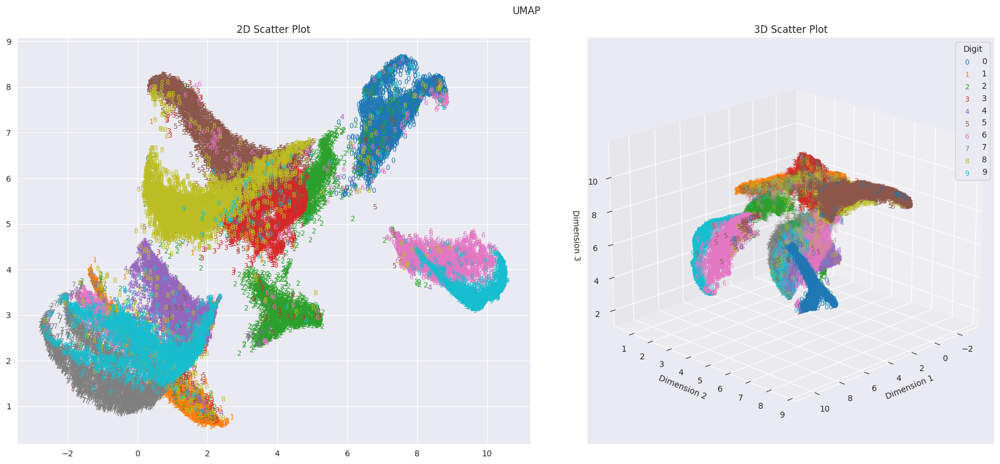

In [ ]:
# UMAP
umap_reducer = umap.UMAP(n_components=n_components)
X_umap = umap_reducer.fit_transform(X_train_scaled)

plot_dim_reduction_2d_3d(X_umap, y_train, "UMAP")
# plot_dim_reduction_3d_plotly(X_umap, y_train, "UMAP")

**Trustworthiness**:
- Measures how well the local neighborhood structure of the original data is preserved in the reduced-dimensional space.
- Higher trustworthiness indicates better preservation of the local structure.


In [ ]:


from joblib import Parallel, delayed
from sklearn.manifold import trustworthiness


def compute_partial_trustworthiness(start, end, X, X_embedded):
    return trustworthiness(X[start:end], X_embedded[start:end], n_neighbors=15)

n_jobs = 10  # Use all available CPU cores
chunk_size = len(X_train_scaled) // n_jobs

results = Parallel(n_jobs=n_jobs)(
    delayed(compute_partial_trustworthiness)(i, i + chunk_size, X_train_scaled, X_umap)
    for i in range(0, len(X_train_scaled), chunk_size)
)


# trustworthiness_umap = trustworthiness(X_train_scaled, X_umap, n_neighbors=15)
trustworthiness_umap_approx = np.mean(results)
print("UMAP - Trustworthiness:", trustworthiness_umap_approx)

UMAP - Trustworthiness: 0.9339182637666583


## 2b: Investigating the Impact of Training Sample Size on Classification Performance Across a Variety of Methods

In [ ]:
# Classification Methods
from sklearn.linear_model import PassiveAggressiveClassifier, SGDClassifier, SGDOneClassSVM
from sklearn.naive_bayes import GaussianNB, MultinomialNB


models_map = {
  "lr": {
    'name': 'Logistic Regression',
    'model': LogisticRegression(random_state=random_state, n_jobs=-1, solver='saga'),
  },
  "rf": {
    'name': 'Random Forest',
    'model': RandomForestClassifier(random_state=random_state, n_jobs=-1, n_estimators=100, max_depth=10),
  },
  "knn": {
    'name': 'K-Nearest Neighbors',
    'model': KNeighborsClassifier(n_jobs=-1, n_neighbors=5),
  },
  "dt": {
    'name': 'Decision Tree',
    'model': DecisionTreeClassifier(random_state=random_state, max_depth=10),
  },
  "sgdsvm": {
    'name': 'SGD Linear SVM',
    'model': SGDClassifier(random_state=random_state, n_jobs=-1),
  },
}

In [ ]:
def plot_confusion_matrix(Y_test, Y_pred, labels, model_name, text=''):
    sns.set_style("dark")
    
    # confusion matrix and display
    cm = confusion_matrix(Y_test, Y_pred)
    cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    
    # plot the confusion matrix
    plt.figure(figsize=(12, 8))
    cm_display.plot()
    plt.title(f'Confusion matrix for test data (model: {model_name}, {text})')
    plt.show()
    sns.set_style("darkgrid")
    
def show_classification_report(y_test, y_pred, model_name: str, text=''):
  print(f"Classification Report for test data ({text}, model: {model_name}) \n {classification_report(y_test, y_pred, target_names=y_test.unique())}")

In [ ]:
import time
import warnings
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score


def train_classifier(model_name, X_train, y_train, X_test, y_test, training_sample_size):
    model_info = models_map[model_name]
    model = model_info['model']
    
    # preprocessing = make_pipeline(StandardScaler(), PCA(n_components=500))
    # X_train_preprocessed = preprocessing.fit_transform(X_train)
    # X_test_preprocessed = preprocessing.transform(X_test)
    
    if model_name in ['rf', 'dt']:
        # Divide and conquer approach for Random Forest
        K = 10  # Number of parts to split the data into
        X_parts = np.array_split(X_train, K)
        y_parts = np.array_split(y_train, K)
        
        rf_classifiers = []
        for i in range(K):
            rf_classifier = model_info['model']
            rf_classifier.fit(X_parts[i], y_parts[i])
            rf_classifiers.append(rf_classifier)
        
        model = VotingClassifier(
            estimators=[(f'rf_{i}', clf) for i, clf in enumerate(rf_classifiers)], 
            voting='hard', 
            n_jobs=-1
        )
        model.fit(X_train, y_train)
    
    elif model_name in ['knn', 'lr']:
        # Train on each batch and average the results
        K = 10  # Number of parts to split the data into
        X_parts = np.array_split(X_train, K)
        y_parts = np.array_split(y_train, K)
        
        classifiers = []
        for i in range(K):
            classifier = model_info['model']
            classifier.fit(X_parts[i], y_parts[i])
            classifiers.append(classifier)
        
        model = classifiers
    
    elif model_name in ['sgdsvm']:
        # Use partial_fit for Multinomial Naive Bayes and SGD Linear SVM
        K = 10  # Number of parts to split the data into
        X_parts = np.array_split(X_train, K)
        y_parts = np.array_split(y_train, K)
        
        print(X_parts[0].shape, y_parts[0].shape)
        
        for i in range(K):
            model.partial_fit(X_parts[i], y_parts[i], classes=np.unique(y_train))
    
    else:
        # Regular fit for other classifiers
        model.fit(X_train, y_train)
    
    
    # making predictions
    if model_name in ['knn', 'lr']:
        # Average the test predictions
        y_pred = np.zeros((len(X_test), len(classifiers)))
        for i, classifier in enumerate(classifiers):
            y_pred[:, i] = classifier.predict(X_test)
        y_pred = np.round(np.mean(y_pred, axis=1)).astype(int)
            
        # average the train prediction
        y_train_pred = np.zeros((len(X_train), len(classifiers)))
        for i, classifier in enumerate(classifiers):
            y_train_pred[:, i] = classifier.predict(X_train)
        y_train_pred = np.round(np.mean(y_train_pred, axis=1)).astype(int)
    else:
        y_pred = model.predict(X_test)
        y_train_pred = model.predict(X_train)
    
    # test scores
    balanced_accuracy = balanced_accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    # train scores
    balanced_accuracy_train = balanced_accuracy_score(y_train, y_train_pred)
    precision_train = precision_score(y_train, y_train_pred, average='macro')
    recall_train = recall_score(y_train, y_train_pred, average='macro')
    f1_train = f1_score(y_train, y_train_pred, average='macro')    
    
    print(f'Test Results for {model_info["name"]} (training sample size: {training_sample_size}): balanced accuracy: {balanced_accuracy}, Precision: {precision}, Recall: {recall}, F1-score: {f1}')
    print(f'Train Results for {model_info["name"]} (training sample size: {training_sample_size}): balanced accuracy: {balanced_accuracy_train}, Precision: {precision_train}, Recall: {recall_train}, F1-score: {f1_train}')
    
    return y_pred, y_train_pred, balanced_accuracy, precision, recall, f1, balanced_accuracy_train, \
        precision_train, recall_train, f1_train

def process_model(X_train, X_test, y_train, y_test, model_key):
    # Train and evaluate classifiers for different sample sizes
    sample_sizes = [1000, 2000, 5000, 10000, 20000, 30000]
    results = []
    
    preprocessing = make_pipeline(StandardScaler(), PCA(n_components=500))
    X_train_preprocessed = preprocessing.fit_transform(X_train)
    X_test_preprocessed = preprocessing.transform(X_test)
    
    for size in sample_sizes:
        X_train_subset = X_train_preprocessed[:size]
        y_train_subset = y_train[:size]
        
        # Start timing the model fitting
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=FutureWarning)
            
            start_time = time.time()
            y_pred, y_train_pred, accuracy, precision, recall, f1, \
                balanced_accuracy_train, precision_train, recall_train, f1_train \
                    = train_classifier(model_key, X_train_subset, y_train_subset, X_test_preprocessed, y_test, size)
            elapsed_time = time.time() - start_time
        
            results.append({
                'sample_size': size,
                'test_balanced_accuracy': accuracy,
                'test_precision': precision,
                'test_recall': recall,
                'test_f1': f1,
                'train_balanced_accuracy': balanced_accuracy_train,
                'train_precision': precision_train,
                'train_recall': recall_train,
                'train_f1': f1_train,
                'y_pred': y_pred,
                'y_train_pred': y_train_pred,
                'training_time': elapsed_time
            })
        
    return results

In [ ]:
# debug process model with all the classifiers
# process_model(X_train, y_train, X_test, y_test, 'lr')
# process_model(X_train, y_train, X_test, y_test, 'rf')
# process_model(X_train, y_train, X_test, y_test, 'knn')
# process_model(X_train, y_train, X_test, y_test, 'dt')
# process_model(X_train, y_train, X_test, y_test, 'sgdsvm')

In [ ]:
def run_main(model_map, X_train, X_test, Y_train, Y_test, prints=True):
    results = {} # keys are model keys and values are results dictionaries
    
    with concurrent.futures.ThreadPoolExecutor() as executor:
        futures = {}
        for model_key, model_info in model_map.items():
            future = executor.submit(process_model, X_train, X_test, Y_train, Y_test, model_key)
            futures[future] = model_key
        
        for future in concurrent.futures.as_completed(futures):
            model_key = futures[future]
            result = future.result()
            results[model_key] = result
                    
    return results

In [ ]:
reuslts_aaa = run_main(models_map, X_train, X_test, y_train, y_test)

In [ ]:
# store the result
# dump(reuslts, 'results.joblib')

['results.joblib']

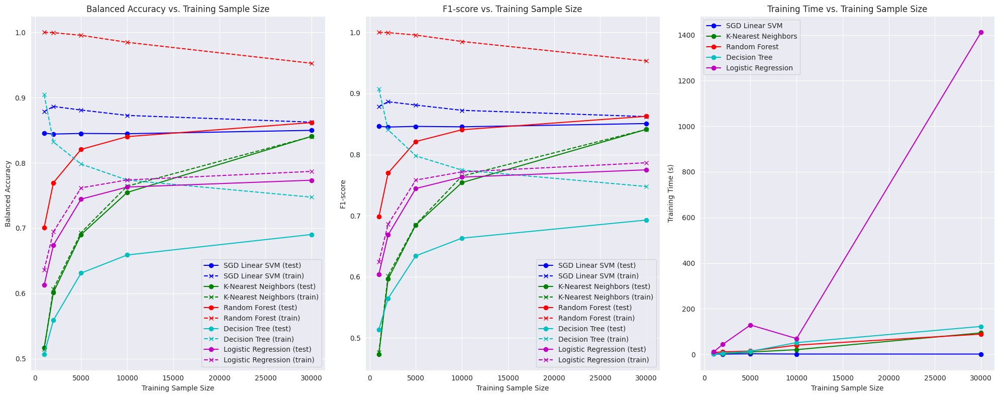

In [ ]:
import matplotlib.pyplot as plt

# plot the results in function of the training sample size, of all models
results = load('results.joblib')

# Define a list of colors for the models
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

def plot_results(results):
    fig, axes = plt.subplots(1, 3, figsize=(20, 8))
    
    for i, (model_key, result) in enumerate(results.items()):
        sample_sizes = [r['sample_size'] for r in result]
        test_balanced_accuracies = [r['test_balanced_accuracy'] for r in result]
        train_balanced_accuracies = [r['train_balanced_accuracy'] for r in result]
        test_f1_scores = [r['test_f1'] for r in result]
        train_f1_scores = [r['train_f1'] for r in result]
        training_times = [r['training_time'] for r in result]
        
        color = colors[i % len(colors)]  # Use the next color from the list
        
        # Plot Balanced Accuracy
        axes[0].plot(sample_sizes, test_balanced_accuracies, label=f'{models_map[model_key]["name"]} (test)', color=color, marker='o')
        axes[0].plot(sample_sizes, train_balanced_accuracies, label=f'{models_map[model_key]["name"]} (train)', color=color, linestyle='--', marker='x')
        axes[0].set_xlabel('Training Sample Size')
        axes[0].set_ylabel('Balanced Accuracy')
        axes[0].set_title('Balanced Accuracy vs. Training Sample Size')
        axes[0].legend()
        
        # Plot F1-score
        axes[1].plot(sample_sizes, test_f1_scores, label=f'{models_map[model_key]["name"]} (test)', color=color, marker='o')
        axes[1].plot(sample_sizes, train_f1_scores, label=f'{models_map[model_key]["name"]} (train)', color=color, linestyle='--', marker='x')
        axes[1].set_xlabel('Training Sample Size')
        axes[1].set_ylabel('F1-score')
        axes[1].set_title('F1-score vs. Training Sample Size')
        axes[1].legend()
        
        # Plot Training Time
        axes[2].plot(sample_sizes, training_times, label=f'{models_map[model_key]["name"]}', color=color, marker='o')
        axes[2].set_xlabel('Training Sample Size')
        axes[2].set_ylabel('Training Time (s)')
        axes[2].set_title('Training Time vs. Training Sample Size')
        axes[2].legend()
        
    plt.tight_layout()
    plt.show()
    
plot_results(results)

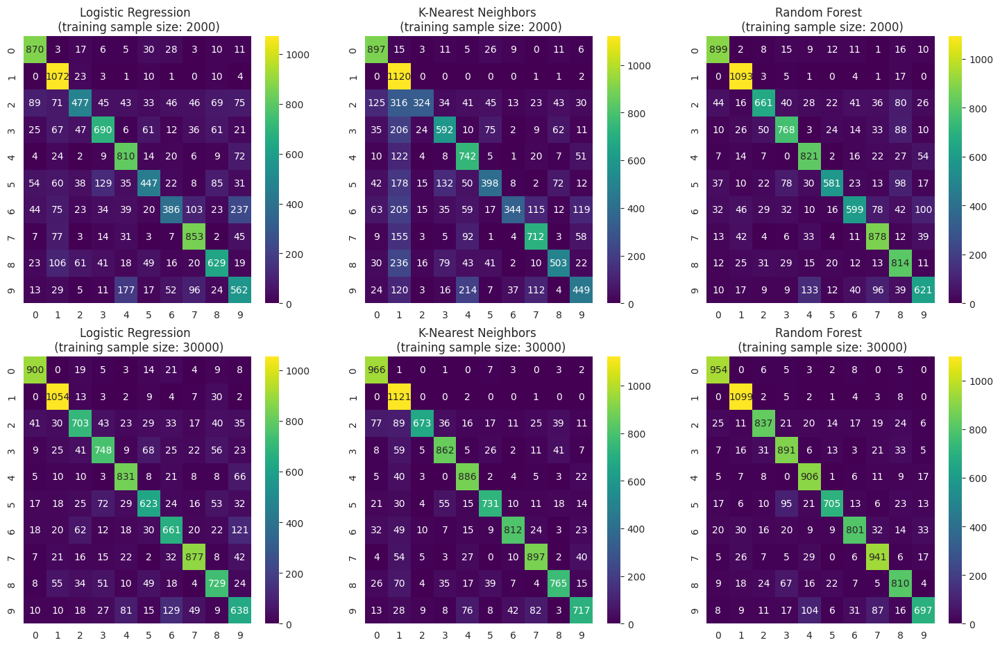

In [ ]:
# plot the confusion matrix of logistic regression, knn and random forest;
# for the test data. It has to be a (2, 3), where in the first row we have
# the performance with training sample size of 2000 and in the second row
# the performance with training sample size of 30000
# the columns are the models: logistic regression, knn and random forest
# the title of the plot is 'Confusion Matrix for test data'
# the text in the title of each subplot is the name of the model
fig, ax = plt.subplots(2, 3, figsize=(18, 11))

for i, model_key in enumerate(['lr', 'knn', 'rf']):
    for j, sample_size in enumerate([2000, 30000]):
        result = results[model_key]
        result = [r for r in result if r['sample_size'] == sample_size][0]
        y_pred = result['y_pred']
                
        cm = confusion_matrix(y_test, y_pred)
        sns.heatmap(cm, annot=True, fmt='d', ax=ax[j, i], cmap='viridis')
        
        ax[j, i].set_title(f'{models_map[model_key]['name']} \n (training sample size: {sample_size})')
        
# fig.suptitle('Confusion Matrix for test data')
# plt.tight_layout()
plt.show()

In [ ]:
# compute the f1-score per class and average them across al models, per training sample size
# and store the results in a dictionary
f1_scores = {}
for model_key, result in results.items():
    for r in result:
        sample_size = r['sample_size']
        f1 = f1_score(y_test, r['y_pred'], average=None)
        f1_scores[(model_key, sample_size)] = f1
        
# compute the average f1-score per class across all models
average_f1_scores = {}
for sample_size in [2000, 30000]:
    f1s = [f1_scores[(model_key, sample_size)] for model_key in models_map.keys()]
    average_f1_scores[sample_size] = np.mean(f1s, axis=0)


y_test_index = y_test.unique()

# sort the index
y_test_index = np.sort(y_test_index)

# create a dataframe with the average f1-scores
average_f1_df = pd.DataFrame(average_f1_scores, index=y_test_index)

# raname the index
average_f1_df.index = [f'F1-score for digit {i}' for i in y_test_index]
average_f1_df.columns = ['2000 training samples', '30000 training samples']

# round the values to 2 decimal places
average_f1_df = average_f1_df.round(2)

display(average_f1_df)

# export in latex format
print(average_f1_df.to_latex(float_format="%.2f", caption="Average F1-scores per digit for different training sample sizes and models", label="tab:average_f1_scores", bold_rows=True, column_format="|c|c|"))

,2000 training samples,30000 training samples
F1-score for digit 0,0.83,0.90
F1-score for digit 1,0.81,0.89
F1-score for digit 2,0.60,0.75
F1-score for digit 3,0.69,0.79
F1-score for digit 4,0.74,0.83
F1-score for digit 5,0.62,0.76
F1-score for digit 6,0.58,0.76
F1-score for digit 7,0.76,0.84
F1-score for digit 8,0.66,0.78
F1-score for digit 9,0.59,0.72


\begin{table}
\caption{Average F1-scores per digit for different training sample sizes and models}
\label{tab:average_f1_scores}
\begin{tabular}{|c|c|}
\toprule
 & 2000 training samples & 30000 training samples \\
\midrule
\textbf{F1-score for digit 0} & 0.83 & 0.90 \\
\textbf{F1-score for digit 1} & 0.81 & 0.89 \\
\textbf{F1-score for digit 2} & 0.60 & 0.75 \\
\textbf{F1-score for digit 3} & 0.69 & 0.79 \\
\textbf{F1-score for digit 4} & 0.74 & 0.83 \\
\textbf{F1-score for digit 5} & 0.62 & 0.76 \\
\textbf{F1-score for digit 6} & 0.58 & 0.76 \\
\textbf{F1-score for digit 7} & 0.76 & 0.84 \\
\textbf{F1-score for digit 8} & 0.66 & 0.78 \\
\textbf{F1-score for digit 9} & 0.59 & 0.72 \\
\bottomrule
\end{tabular}
\end{table}



In [ ]:
# show in a table the results
def display_results_table(results):
    for model_key, result in results.items():
        print(f"Results for {models_map[model_key]['name']}")
        df = pd.DataFrame(result)
        
        # drop y_pred and y_train_pred columns
        df.drop(columns=['y_pred', 'y_train_pred'], inplace=True)
        
        # round the results to 2 decimal places
        df = df.round(2)
        
        # round the sample size to integer
        df['sample_size'] = df['sample_size'].truncate()
        
        df.rename(columns={
            'test_balanced_accuracy': 'Test Balanced Accuracy',
            'test_precision': 'Test Precision',
            'test_recall': 'Test Recall',
            'test_f1': 'Test F1',
            'train_balanced_accuracy': 'Train Balanced Accuracy',
            'train_precision': 'Train Precision',
            'train_recall': 'Train Recall',
            'train_f1': 'Train F1',
            'training_time': 'Training Time (seconds)',
            'sample_size': 'Sample Size'
        }, inplace=True)
        
        display(df)
        
display_results_table(results)

Results for SGD Linear SVM


,Sample Size,Test Balanced Accuracy,Test Precision,Test Recall,Test F1,Train Balanced Accuracy,Train Precision,Train Recall,Train F1,Training Time (seconds)
0,1000,0.85,0.85,0.85,0.85,0.88,0.88,0.88,0.88,1.94
1,2000,0.84,0.84,0.85,0.84,0.89,0.89,0.89,0.89,1.08
2,5000,0.85,0.85,0.85,0.85,0.88,0.88,0.88,0.88,2.56
3,10000,0.84,0.85,0.85,0.85,0.87,0.87,0.87,0.87,1.51
4,30000,0.85,0.85,0.85,0.85,0.86,0.86,0.86,0.86,1.35


Results for K-Nearest Neighbors


,Sample Size,Test Balanced Accuracy,Test Precision,Test Recall,Test F1,Train Balanced Accuracy,Train Precision,Train Recall,Train F1,Training Time (seconds)
0,1000,0.52,0.56,0.52,0.47,0.51,0.58,0.51,0.48,5.29
1,2000,0.60,0.66,0.61,0.60,0.61,0.66,0.61,0.60,3.33
2,5000,0.69,0.74,0.70,0.68,0.69,0.74,0.69,0.69,10.29
3,10000,0.75,0.79,0.76,0.75,0.76,0.80,0.76,0.76,20.65
4,30000,0.84,0.85,0.84,0.84,0.84,0.85,0.84,0.84,94.23


Results for Random Forest


,Sample Size,Test Balanced Accuracy,Test Precision,Test Recall,Test F1,Train Balanced Accuracy,Train Precision,Train Recall,Train F1,Training Time (seconds)
0,1000,0.70,0.70,0.71,0.70,1.00,1.00,1.00,1.00,8.56
1,2000,0.77,0.78,0.77,0.77,1.00,1.00,1.00,1.00,10.91
2,5000,0.82,0.82,0.82,0.82,1.00,1.00,1.00,1.00,14.76
3,10000,0.84,0.85,0.84,0.84,0.98,0.99,0.98,0.99,40.62
4,30000,0.86,0.87,0.86,0.86,0.95,0.95,0.95,0.95,88.83


Results for Decision Tree


,Sample Size,Test Balanced Accuracy,Test Precision,Test Recall,Test F1,Train Balanced Accuracy,Train Precision,Train Recall,Train F1,Training Time (seconds)
0,1000,0.51,0.52,0.51,0.51,0.90,0.91,0.90,0.91,3.24
1,2000,0.56,0.58,0.56,0.56,0.83,0.86,0.83,0.84,5.09
2,5000,0.63,0.64,0.63,0.63,0.80,0.80,0.80,0.80,13.44
3,10000,0.66,0.67,0.66,0.66,0.77,0.78,0.77,0.77,51.61
4,30000,0.69,0.69,0.69,0.69,0.75,0.75,0.75,0.75,122.50


Results for Logistic Regression


,Sample Size,Test Balanced Accuracy,Test Precision,Test Recall,Test F1,Train Balanced Accuracy,Train Precision,Train Recall,Train F1,Training Time (seconds)
0,1000,0.61,0.61,0.62,0.60,0.64,0.64,0.64,0.62,10.46
1,2000,0.67,0.68,0.68,0.67,0.69,0.69,0.69,0.69,44.08
2,5000,0.74,0.75,0.75,0.74,0.76,0.76,0.76,0.76,128.84
3,10000,0.76,0.76,0.77,0.76,0.77,0.77,0.77,0.77,69.25
4,30000,0.77,0.77,0.78,0.77,0.79,0.79,0.79,0.79,1411.37


## 2c: Assessing the Ability of Clustering Methods to Recover Class Structure in a Large Dataset

In [10]:
# list 3 different clustering methods to investiate
from sklearn.cluster import DBSCAN, AgglomerativeClustering, KMeans, MiniBatchKMeans
from sklearn.mixture import GaussianMixture


cluster_models = {
  "kmeans": {
      'name': 'K-Means',
      
      # model with suitable paramters for a MNIST high dimensional dataset
      'model': MiniBatchKMeans(n_clusters=10, random_state=random_state),
  },
  
  # 'hierarchical': {
  #     'name': 'Hierarchical Clustering',
      
  #     # model with suitable paramters for a MNIST high dimensional dataset
  #     'model': AgglomerativeClustering(n_clusters=10),
  # },
  
  'dbscan': {
      'name': 'DBSCAN',
      
      # model with suitable paramters for a MNIST high dimensional dataset
      'model': DBSCAN(eps=0.5, min_samples=5, n_jobs=-1),
  },
  
  'gauassian_mixture': {
        'name': 'Gaussian Mixture',
        
        # model with suitable paramters for a MNIST high dimensional dataset
        'model': GaussianMixture(n_components=10, random_state=random_state),
    }
}

In [13]:
preprocessing = make_pipeline(StandardScaler(), PCA(n_components=400))
X_train_preprocessed = preprocessing.fit_transform(X_train)
X_test_preprocessed = preprocessing.transform(X_test)

In [12]:
# cluster the data using the 3 clustering methods and plot the results
from multiprocessing import Pool


def cluster_data(X_train, X_test, model_key):
    model_info = cluster_models[model_key]
    model = model_info['model']
    
    # fit the model
    model.fit(X_train)
    
    # predict the clusters
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    return y_train_pred, y_test_pred

def cluster_data_parallel(method):
    if method == 'kmeans':
        return cluster_data(X_train_preprocessed, X_test_preprocessed, 'kmeans')
    elif method == 'gauassian_mixture':
        return cluster_data(X_train_preprocessed, X_test_preprocessed, 'gauassian_mixture')
    elif method == 'dbscan':
        return cluster_data(X_train_preprocessed, X_test_preprocessed, 'dbscan')


methods = ['kmeans', 'gauassian_mixture', 'dbscan']

with Pool() as pool:
    results = pool.map(cluster_data_parallel, methods)

y_train_kmeans, y_test_kmeans = results[0]
y_train_hierarchical, y_test_hierarchical = results[1]
y_train_dbscan, y_test_dbscan = results[2]

# plot the results
fig, ax = plt.subplots(1, 3, figsize=(20, 8))

# K-Means
sns.scatterplot(x=X_train_preprocessed[:, 0], y=X_train_preprocessed[:, 1], hue=y_train_kmeans, palette='tab10', ax=ax[0])
ax[0].set_title('K-Means Clustering for Training Data')
ax[0].set_xlabel('Principal Component 1')
ax[0].set_ylabel('Principal Component 2')

# Hierarchical Clustering
sns.scatterplot(x=X_train_preprocessed[:, 0], y=X_train_preprocessed[:, 1], hue=y_train_hierarchical, palette='tab10', ax=ax[1])
ax[1].set_title('gauassian_mixture Clustering for Training Data')
ax[1].set_xlabel('Principal Component 1')
ax[1].set_ylabel('Principal Component 2')

# # DBSCAN
sns.scatterplot(x=X_train_preprocessed[:, 0], y=X_train_preprocessed[:, 1], hue=y_train_dbscan, palette='tab10', ax=ax[2])
ax[2].set_title('DBSCAN Clustering for Training Data')
ax[2].set_xlabel('Principal Component 1')
ax[2].set_ylabel('Principal Component 2')

plt.tight_layout()
plt.show()

KeyError: 'dbscan'

In [11]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import homogeneity_score, completeness_score

local_clusters = 100

# Global clustering using KMeans, DBSCAN, and Hierarchical clustering
global_clusters = 10  # Adjust the number of global clusters

### K-means

In [14]:

local_kmeans = MiniBatchKMeans(n_clusters=local_clusters, random_state=42)
local_kmeans_labels = local_kmeans.fit_predict(X_train_preprocessed)
local_centroids = local_kmeans.cluster_centers_

# KMeans global clustering
kmeans_global = MiniBatchKMeans(n_clusters=global_clusters, random_state=42)
kmeans_global_labels = kmeans_global.fit_predict(local_centroids)
kmeans_labels = kmeans_global_labels[local_kmeans_labels]

# print(kmeans_global_labels.shape, kmeans_labels.shape)


# compute homogeneous score and completeness score
# print("Homogeneity Score for KMeans:", homogeneity_score(y_train, kmeans_labels))
# print("Completeness Score for KMeans:", completeness_score(y_train, kmeans_labels))

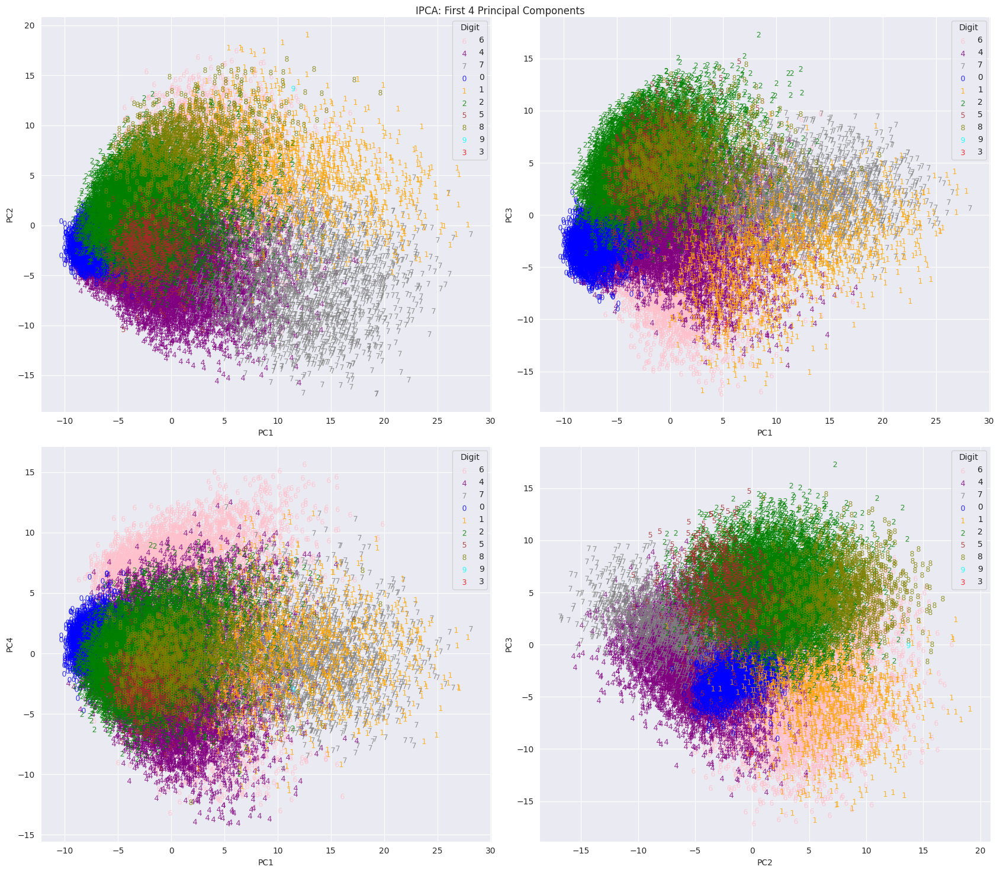

In [81]:
X_pca_kmeans_df = pd.DataFrame({
  'PC1': X_train_preprocessed[:, 0], 
  'PC2': X_train_preprocessed[:, 1], 
  'PC3': X_train_preprocessed[:, 2],
  'PC4': X_train_preprocessed[:, 3],
  'Digit': kmeans_labels})

plot_pcs(X_pca_kmeans_df)

### Hierarchical Clustering

### DBSCAN

In [ ]:
# clustering with DBSCAN
dbscan_global = DBSCAN(n_jobs=-1)
dbscan_global_labels = dbscan_global.fit_predict(local_centroids)

dbscan_labels = dbscan_global_labels[local_labels]
dbscan_score = silhouette_score(X_train_preprocessed, dbscan_labels)
print("DBSCAN Silhouette Score:", dbscan_score)

In [ ]:
hierarchical_labels = kmeans_global_labels[local_labels]

X_pca_hierarchical_df = pd.DataFrame({
  'PC1': X_train_preprocessed[:, 0], 
  'PC2': X_train_preprocessed[:, 1], 
  'PC3': X_train_preprocessed[:, 2],
  'PC4': X_train_preprocessed[:, 3],
    'Digit': k_means_labels})

plot_pcs(X_pca_kmeans_df)

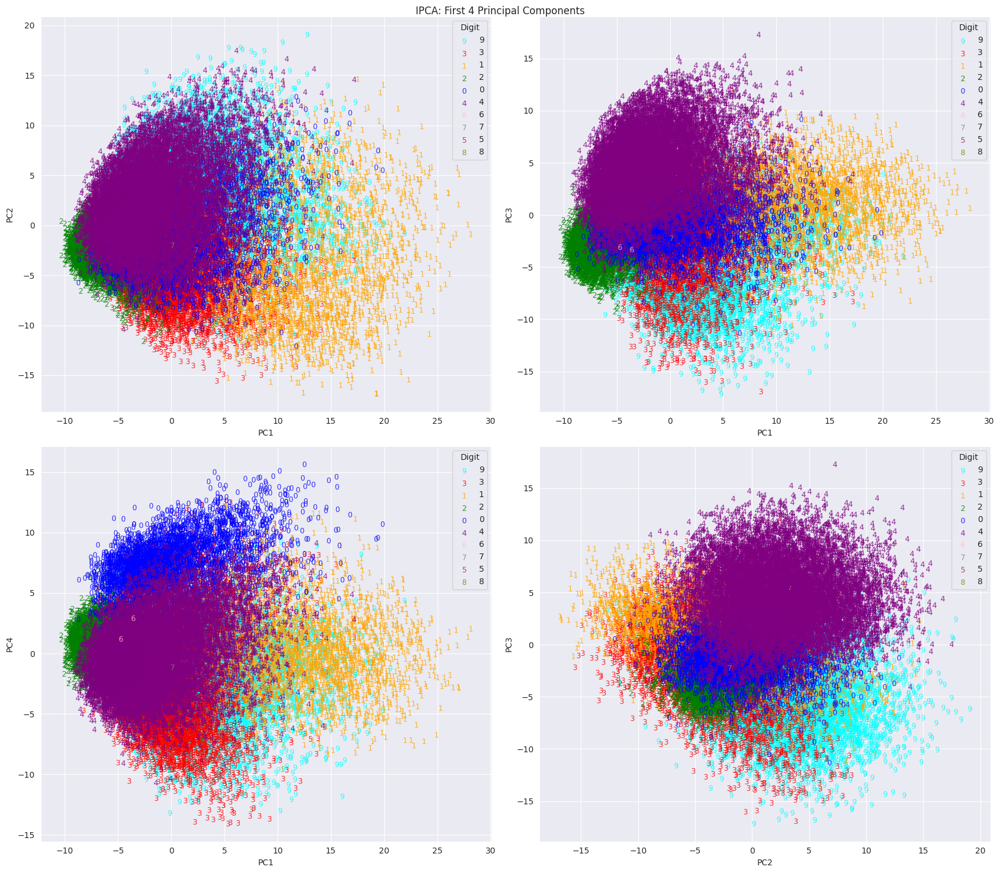

In [20]:
# test birch clustering with visualization

from sklearn.cluster import Birch

birch = Birch(n_clusters=10)
birch_global_labels = birch.fit_predict(local_centroids)
birch_labels = birch_global_labels[local_kmeans_labels]

# birch_score = silhouette_score(X_train_preprocessed, birch_labels)
# print("Birch Silhouette Score:", birch_score)

X_pca_birch_df = pd.DataFrame({
  'PC1': X_train_preprocessed[:, 0], 
  'PC2': X_train_preprocessed[:, 1], 
  'PC3': X_train_preprocessed[:, 2],
  'PC4': X_train_preprocessed[:, 3],
    'Digit': birch_labels})

plot_pcs(X_pca_birch_df)

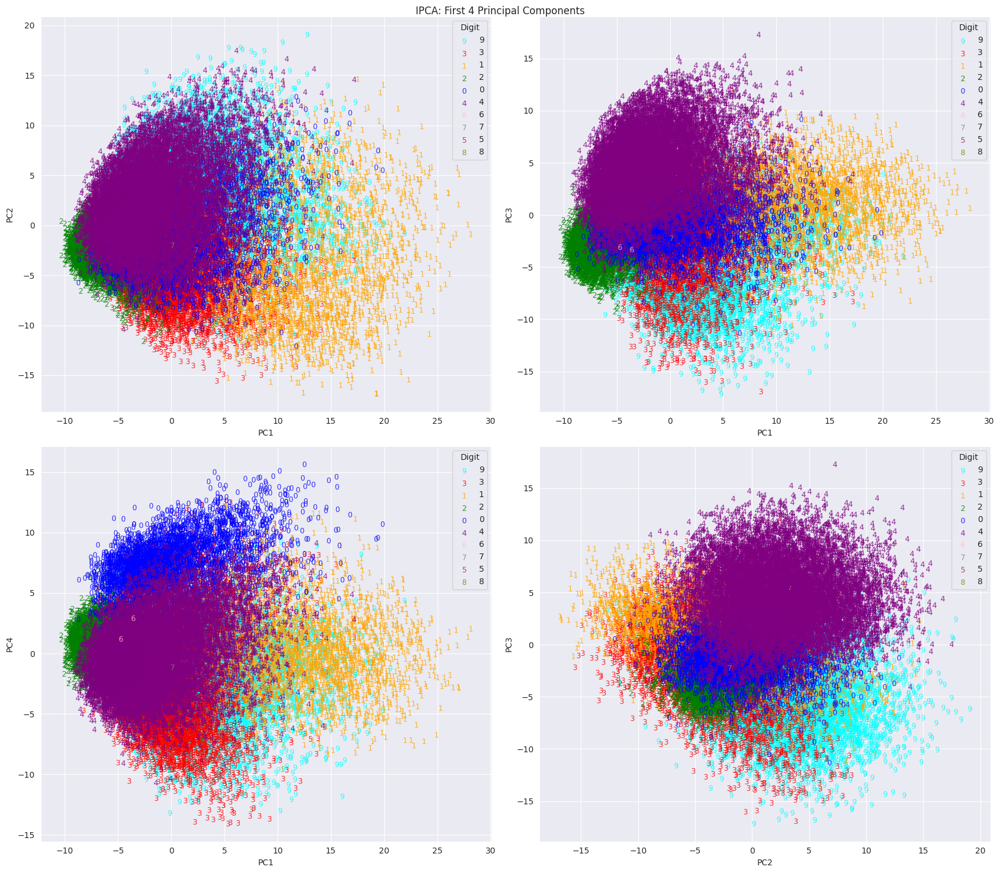

In [21]:
# hierarchical clustering
from sklearn.cluster import AgglomerativeClustering

hierarchical = AgglomerativeClustering(n_clusters=10)
hierarchical_global_labels = hierarchical.fit_predict(local_centroids)
hierarchical_labels = hierarchical_global_labels[local_kmeans_labels]

# hierarchical_score = silhouette_score(X_train_preprocessed, hierarchical_labels)
# print("Hierarchical Silhouette Score:", hierarchical_score)

X_pca_hierarchical_df = pd.DataFrame({
  'PC1': X_train_preprocessed[:, 0], 
  'PC2': X_train_preprocessed[:, 1], 
  'PC3': X_train_preprocessed[:, 2],
  'PC4': X_train_preprocessed[:, 3],
    'Digit': hierarchical_labels})

plot_pcs(X_pca_hierarchical_df)